# LEVEL 1

# Task 1: Data Exploration and Preprocessing
- Explore the dataset and identify the number of rows and columns.
- Check for missing values in each column and handle them accordingly.
- Perform data type conversion if necessary.
- Analyze the distribution of the target variable ("Aggregate rating") and identify any class imbalances.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import folium
from folium.plugins import HeatMap
from scipy.stats import pearsonr
import plotly.io as pio
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.pipeline import Pipeline

In [2]:
dataset = pd.read_csv('Dataset.csv')
dataset.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [3]:
dataset.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


### The number of rows and columns

In [4]:
print("Rows and Columns are : ",dataset.shape)

Rows and Columns are :  (9551, 21)


### Checking missing values and handle

In [5]:
dataset.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In Column 'Cuisines' 9 values are missing

In [6]:
dataset['Cuisines'].fillna(dataset['Cuisines'].mode(), inplace = True)

### Data type conversion

In [7]:
dataset['Restaurant ID'].astype(int)

0       6317637
1       6304287
2       6300002
3       6318506
4       6314302
         ...   
9546    5915730
9547    5908749
9548    5915807
9549    5916112
9550    5927402
Name: Restaurant ID, Length: 9551, dtype: int32

### Distribution of the target variable ("Aggregate rating")

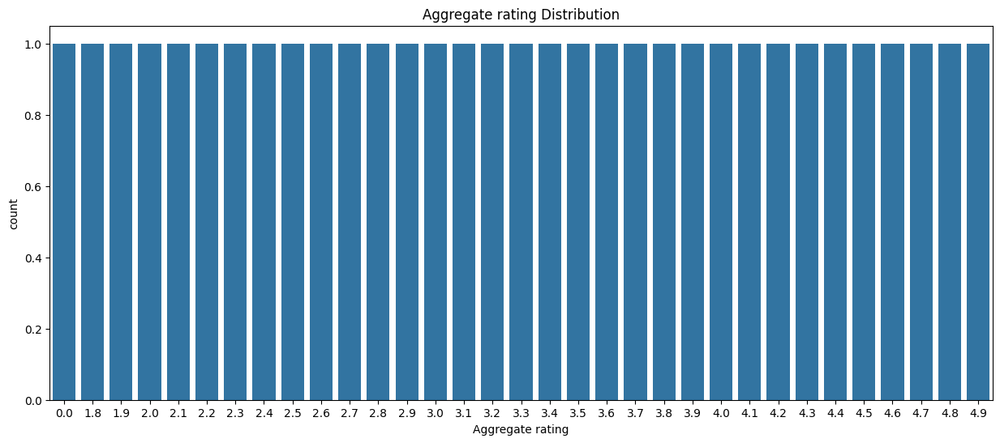

In [8]:
plt.figure(figsize= (15, 6))
sns.countplot(dataset['Aggregate rating'].value_counts())
plt.title('Aggregate rating Distribution')
plt.show()

### Check for class imbalances in the target variable

In [9]:
rating_counts = dataset['Aggregate rating'].value_counts()
rating_counts

Aggregate rating
0.0    2148
3.2     522
3.1     519
3.4     498
3.3     483
3.5     480
3.0     468
3.6     458
3.7     427
3.8     400
2.9     381
3.9     335
2.8     315
4.1     274
4.0     266
2.7     250
4.2     221
2.6     191
4.3     174
4.4     144
2.5     110
4.5      95
2.4      87
4.6      78
4.9      61
2.3      47
4.7      42
2.2      27
4.8      25
2.1      15
2.0       7
1.9       2
1.8       1
Name: count, dtype: int64

_________________________________________________________________________________________________________________________________

## Task 2: Descriptive Analysis

- Calculate basic statistical measures (mean, median, standard deviation, etc.) for numerical columns.
- Explore the distribution of categorical variables like "Country Code," "City," and"Cuisines."
- Identify the top cuisines and cities with the highest number of restaurants.

### Calculate basic statistical measures mean, median, standard deviation, etc.

In [10]:
dataset.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


### Distribution of categorical variables like "Country Code," "City," and"Cuisines."

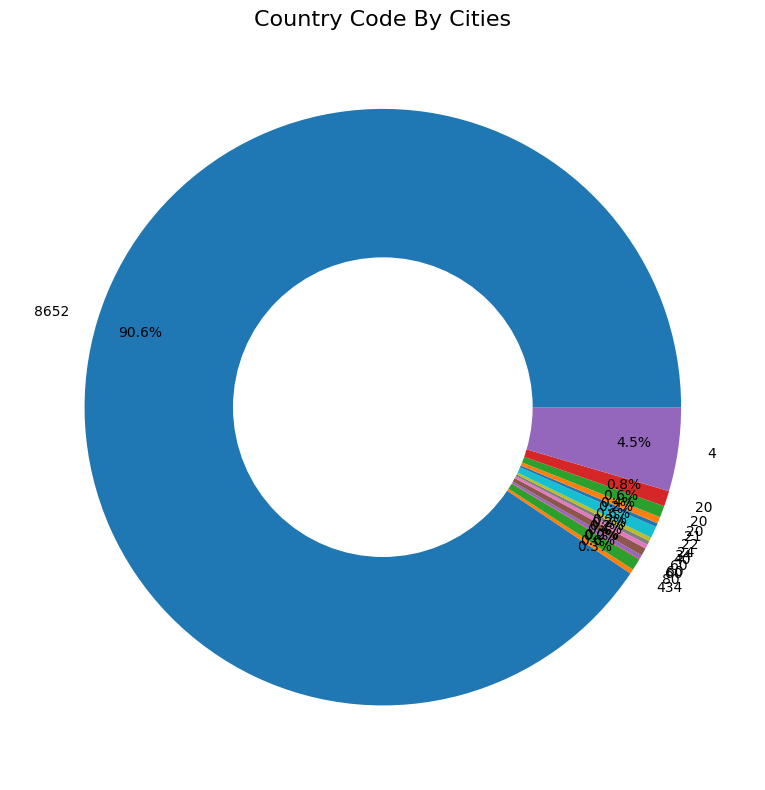

In [11]:
distribution = dataset.groupby('Country Code').count()['City']

fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(aspect="equal"))
contry_codes = dataset['Country Code'].value_counts()
label = [1,2,3,4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15] 

plt.pie(distribution, autopct='%1.1f%%', labels = contry_codes, pctdistance=0.85)
circle = plt.Circle( (0,0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle)
ax.set_title("Country Code By Cities",fontdict={'fontsize': 16})
plt.tight_layout()
plt.show()

## Analysis

**Dominant Segment**
- One segment occupies 90.6% of the pie chart, representing the majority of the cities in the dataset. This segment corresponds to a country code with 8652 cities.

**Other Segments**
- The remaining 9.4% of the chart is divided among several smaller segments.
- The second-largest segment is 4.5%, corresponding to a country code with 434 cities.
- The rest of the segments represent very small percentages, each less than 1%.

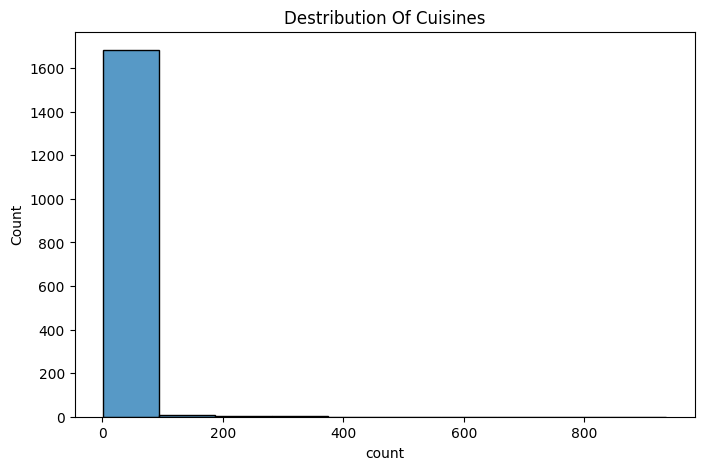

In [12]:
fig, ax = plt.subplots(figsize=(8,5))
top_10 = dataset['Cuisines'].value_counts()
sns.histplot(top_10[:1700], bins = 10)
ax.set(title = 'Destribution Of Cuisines')
plt.show()

### Identifing the top cuisines and cities with the highest number of restaurants.

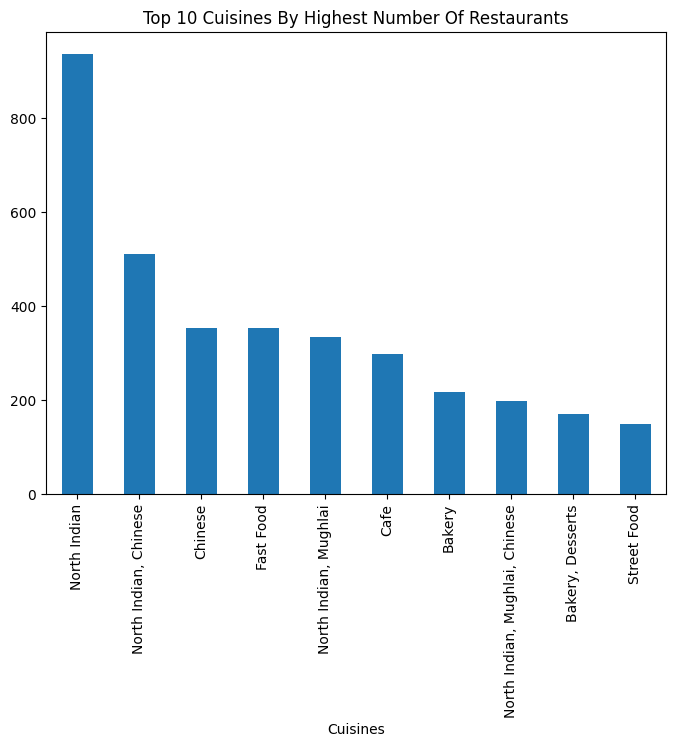

In [13]:
fig, ax = plt.subplots(figsize = (8, 6))

top_10_cuisines = dataset['Cuisines'].value_counts()

top_10_cuisines[:10].plot(kind = 'bar')
ax.set(title = 'Top 10 Cuisines By Highest Number Of Restaurants')
plt.show()

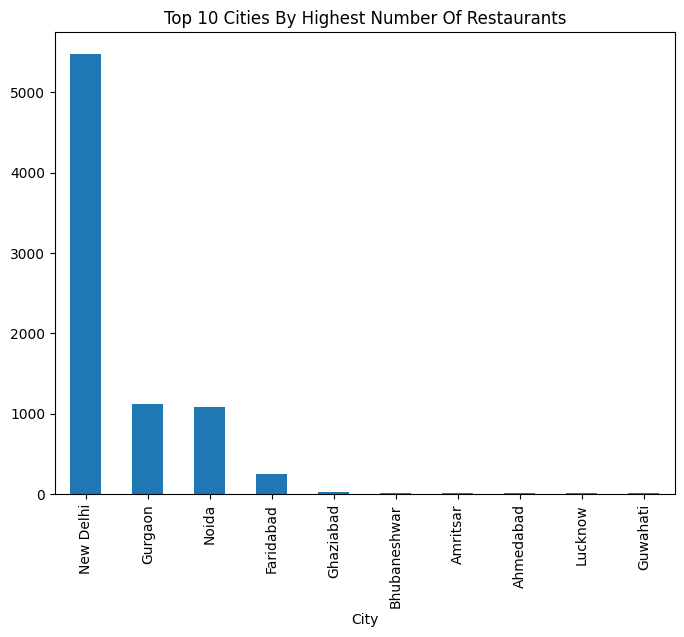

In [14]:
fig, ax = plt.subplots(figsize = (8, 6))
top_10_citis = dataset['City'].value_counts()

top_10_citis[:10].plot(kind = 'bar')
ax.set(title = 'Top 10 Cities By Highest Number Of Restaurants')
plt.show()

_________________________________________________________________________________________________________________________________

# Task 3: Geospatial Analysis

- Visualize the locations of restaurants on a map using latitude and longitude information.
- Analyze the distribution of restaurants across different cities or countries.
- Determine if there is any correlation between the restaurant's location and its rating..


### Locations of restaurants on a map using latitude and longitude information

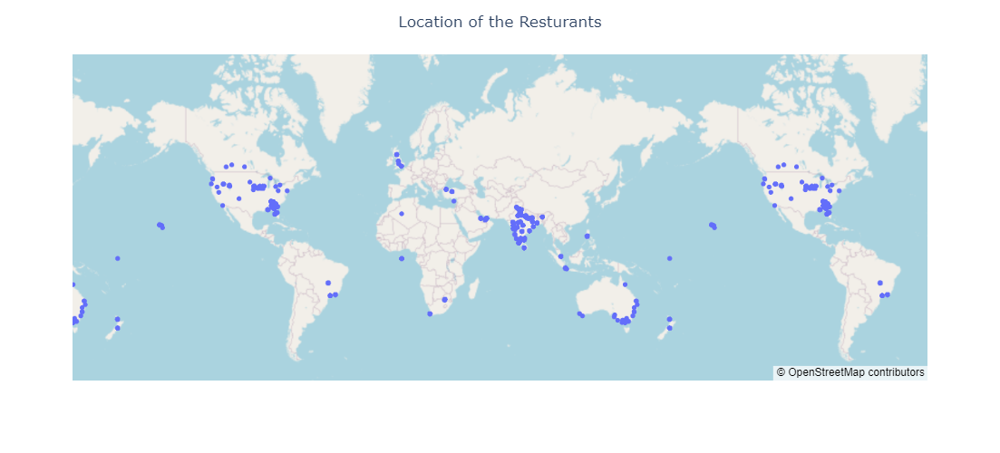

In [15]:
fig = px.scatter_mapbox(dataset, lat='Latitude', lon='Longitude', zoom = 0.25)
fig.update_layout(mapbox_style='open-street-map', height = 500 , width = 800 , title = 'Location of the Resturants' , title_x = 0.5)
fig.show()

In [16]:
map = folium.Map(location=[dataset['Latitude'].mean(), dataset['Longitude'].mean()], zoom_start=2 , height = '75%' , width = '80%')
heat_data = [[row['Latitude'], row['Longitude']] for index, row in dataset.iterrows()]
HeatMap(heat_data, radius=15).add_to(map)
map

### Distribution of restaurants across different cities or countries

In [17]:
city_distribution = dataset.groupby('City').size().reset_index(name='Count')
country_distribution = dataset.groupby('Country Code').size().reset_index(name='Count')

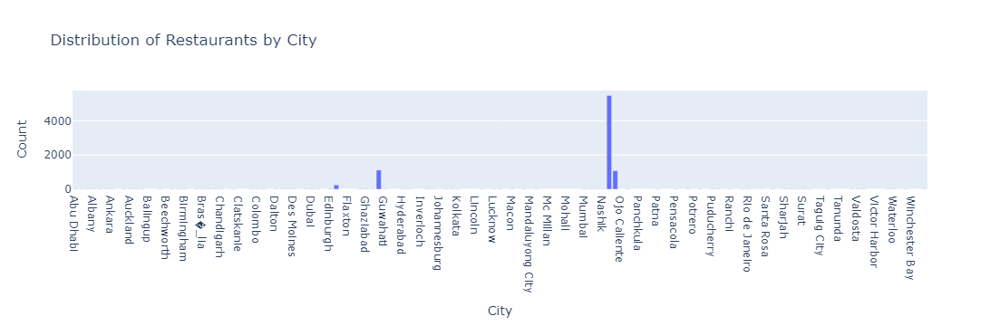

In [18]:
fig_city = px.bar(city_distribution, x='City', y='Count', title='Distribution of Restaurants by City')
fig_city.show()

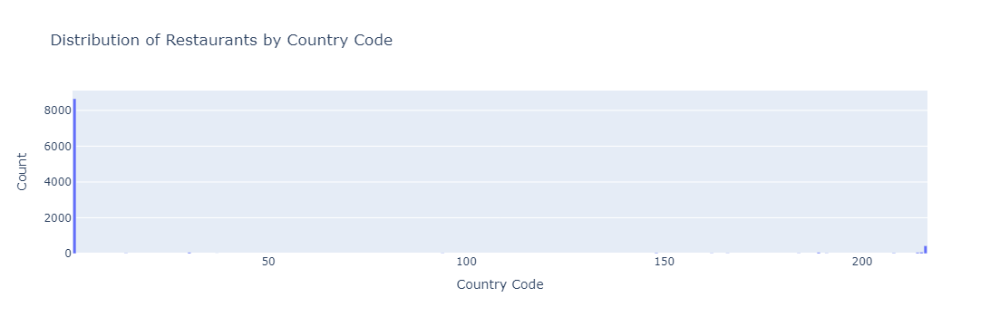

In [19]:
fig_country = px.bar(country_distribution, x='Country Code', y='Count', title='Distribution of Restaurants by Country Code')
fig_country.show()

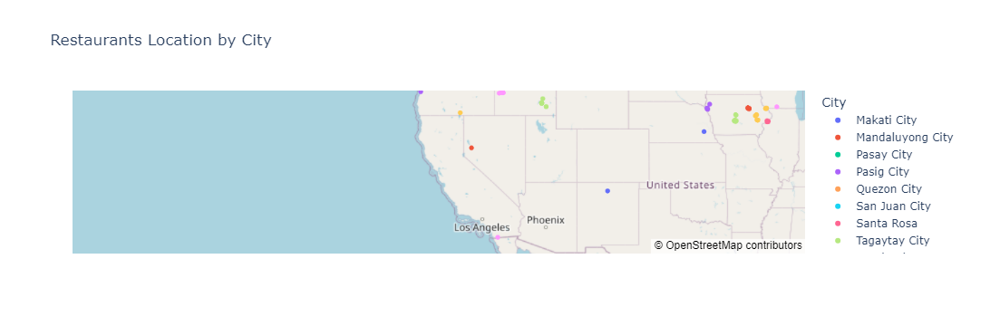

In [20]:
fig_map_city = px.scatter_mapbox(dataset, lat = 'Latitude', lon = 'Longitude', color = 'City', mapbox_style = 'open-street-map', title = 'Restaurants Location by City')
fig_map_city.update_layout(mapbox_zoom = 3, mapbox_center={"lat": 37.7749, "lon": -122.4194})
fig_map_city.show()

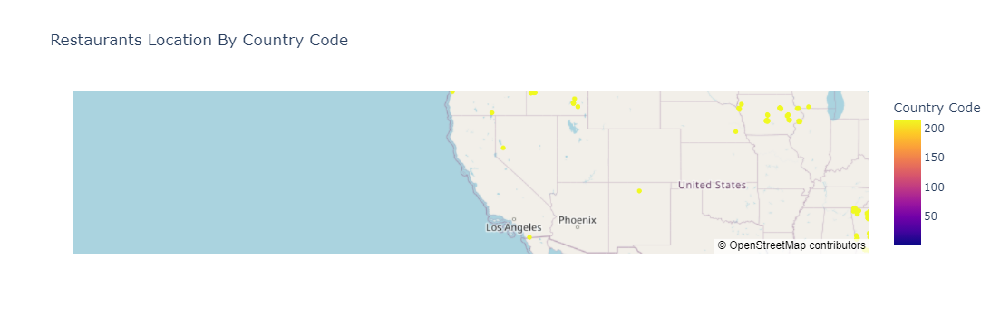

In [21]:
fig_map_country = px.scatter_mapbox(dataset, lat = 'Latitude', lon = "Longitude", color = 'Country Code', mapbox_style = "open-street-map", title = 'Restaurants Location By Country Code')
fig_map_country.update_layout(mapbox_zoom = 3, mapbox_center={"lat": 37.7749, "lon": -122.4194})
fig_map_country.show()

### Correlation between the restaurant's location and its rating

In [22]:
correlation_matrix = dataset[['Latitude', 'Longitude', 'Aggregate rating']].corr()
correlation_matrix

,Latitude,Longitude,Aggregate rating
Latitude,1.000000,0.043207,0.000516
Longitude,0.043207,1.000000,-0.116818
Aggregate rating,0.000516,-0.116818,1.000000


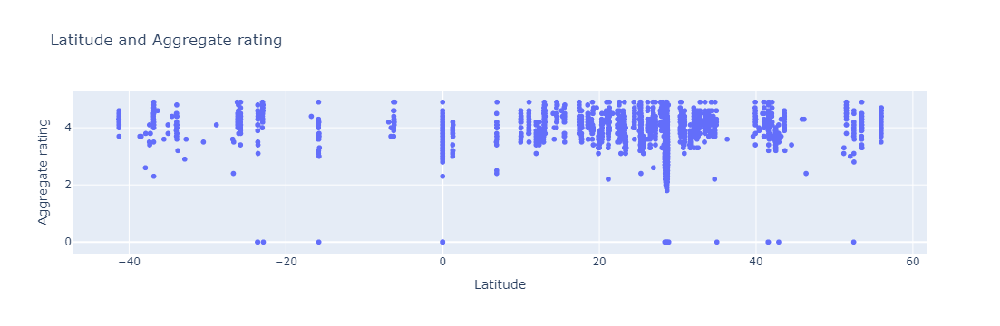

In [23]:
fig_lat = px.scatter(dataset, x = 'Latitude', y = 'Aggregate rating', title = 'Latitude and Aggregate rating', labels = {'Aggregate rating':'Aggregate rating'})
fig_lat.show()

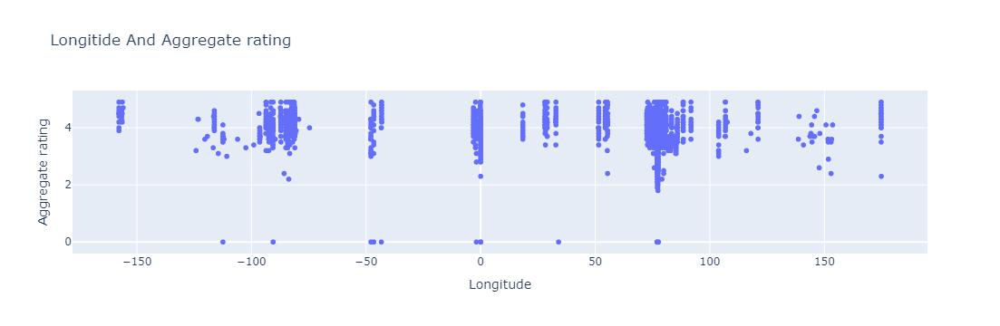

In [24]:
fig_lon = px.scatter(dataset, x = 'Longitude', y = 'Aggregate rating', title = 'Longitide And Aggregate rating', labels = {'Aggregate rating':'Aggregate rating'})
fig_lon.show()

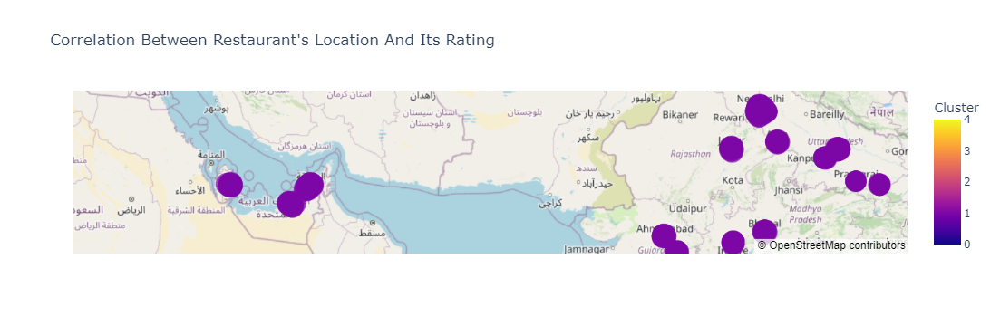

In [25]:
kmeans = KMeans(n_clusters=5)
dataset['Cluster'] = kmeans.fit_predict(dataset[['Latitude', 'Longitude']])
fig_Cluster = px.scatter_mapbox(dataset, lat = 'Latitude', lon = 'Longitude', color = 'Cluster', size = 'Aggregate rating', mapbox_style='open-street-map', title = "Correlation Between Restaurant's Location And Its Rating")
fig_Cluster.update_layout(mapbox_zoom = 4, mapbox_center={"lat": dataset['Latitude'].mean(), "lon": dataset['Longitude'].mean()})
fig_Cluster.show()

_________________________________________________________________________________________________________________________________

# LEVEL 2

# Task 1: Table Booking and Online Delivery
- Determine the percentage of restaurants that 
offer table booking and online delivery
- Compare the average ratings of restaurants 
with table booking and those without
- Analyze the availability of online delivery 
among restaurants with different price ranges..

### Determine the percentage of restaurants that offer table booking and online delivery

In [26]:
(len(dataset[dataset['Has Table booking'] == 'Yes'])/len(dataset))*100

12.124384881164275

In [27]:
(len(dataset[dataset['Has Table booking'] == 'No']) / len(dataset)) * 100

87.87561511883573

In [28]:
(len(dataset[dataset['Has Online delivery'] == 'Yes'])/len(dataset))*100

25.662234321013504

In [29]:
(len(dataset[dataset['Has Online delivery'] == 'No']) / len(dataset)) * 100

74.33776567898649

### Average ratings of restaurants with table booking

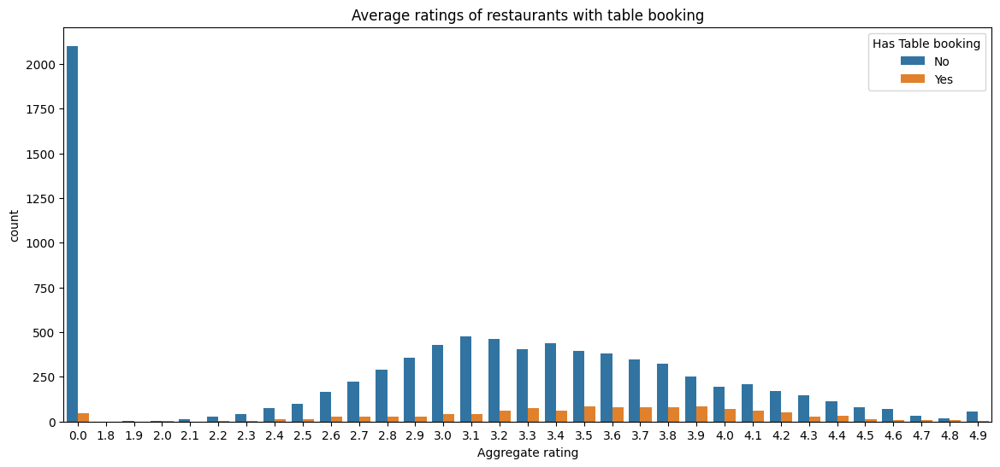

In [30]:
fig, ax = plt.subplots(figsize = (14, 6))
average_rate = dataset['Aggregate rating']
table_booking = dataset['Has Table booking']
sns.countplot(data = dataset, x = 'Aggregate rating', hue = 'Has Table booking')
# ax.title('Average ratings of restaurants with table booking')
plt.title('Average ratings of restaurants with table booking')
plt.show()

#### Average ratings of restaurants

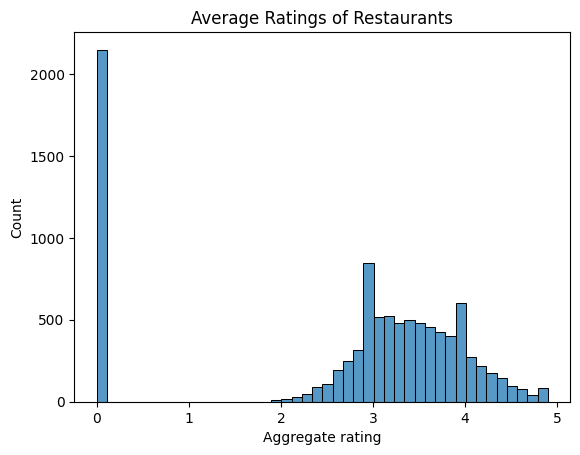

In [31]:
sns.histplot(dataset['Aggregate rating'])
plt.title('Average Ratings of Restaurants')
plt.show()

### Online delivery among restaurants with different price ranges

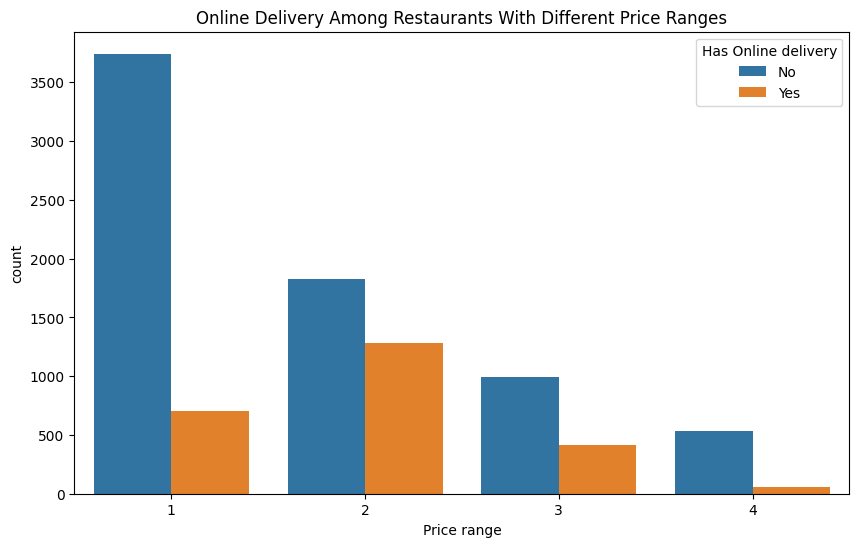

In [32]:
fig = plt.subplots(figsize = (10, 6))
sns.countplot(data = dataset, x = 'Price range', hue = 'Has Online delivery')
plt.title('Online Delivery Among Restaurants With Different Price Ranges')
plt.savefig('Online Delivery Among Restaurants With Different Price Ranges.png')
plt.show()

### Analysis
**Price Range 1**
- **No Online Delivery:** Approximately 3500 restaurants.
- **Yes Online Delivery:** Approximately 500 restaurants.
- **Conclusion:** The majority of restaurants in this price range do not offer online delivery, with a significant difference between those that do and those that don't.

**Price Range 2**
- **No Online Delivery:** Approximately 1700 restaurants.
- **Yes Online Delivery:** Approximately 1300 restaurants.
- **Conclusion:** There is a more balanced distribution in this price range, with a substantial number of restaurants offering online delivery.

**Price Range 3**
- **No Online Delivery:** Approximately 1000 restaurants.
- **Yes Online Delivery:** Approximately 400 restaurants.
- **Conclusion:** Similar to Price Range 1, there are more restaurants that do not offer online delivery compared to those that do, but the difference is less pronounced.

**Price Range 4**
- **No Online Delivery:** Approximately 400 restaurants.
- **Yes Online Delivery:** Less than 100 restaurants.
- **Conclusion:** Very few restaurants in this price range offer online delivery, with a significant majority not providing this service.

#### Overall Analysis
- **Trend:** As the price range increases, the number of restaurants offering online delivery decreases.
- Price Range 1 and Price Range 4 show a strong preference for not offering online delivery services.
- Price Range 2 shows the highest adoption of online delivery services compared to other price ranges.
- Price Range 3 is somewhat balanced but still leans towards not offering online delivery.

_________________________________________________________________________________________________________________________________

# Task 2: Price Range Analysis
- Determine the most common price range 
among all the restaurants
- Calculate the average rating for each price 
range
- Identify the color that represents the highest 
average rating among different price ranges...

### Most common price range among all the restaurants

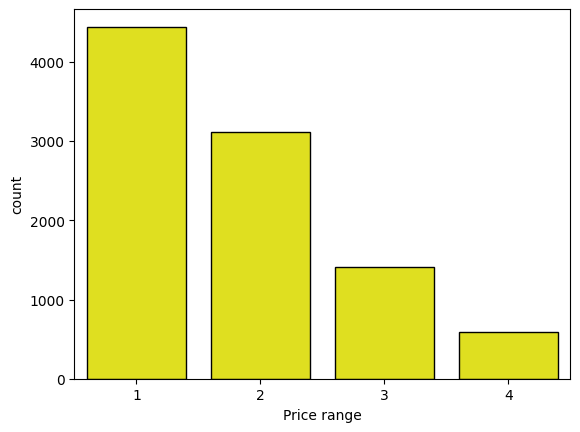

Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [33]:
com_price_range = dataset['Price range'].value_counts()
sns.barplot(com_price_range, color = 'yellow', edgecolor = 'k')
plt.show()
com_price_range

1, 2, 3, & 4 Are a Common price range among all restaurants.

### Average rating for each price range

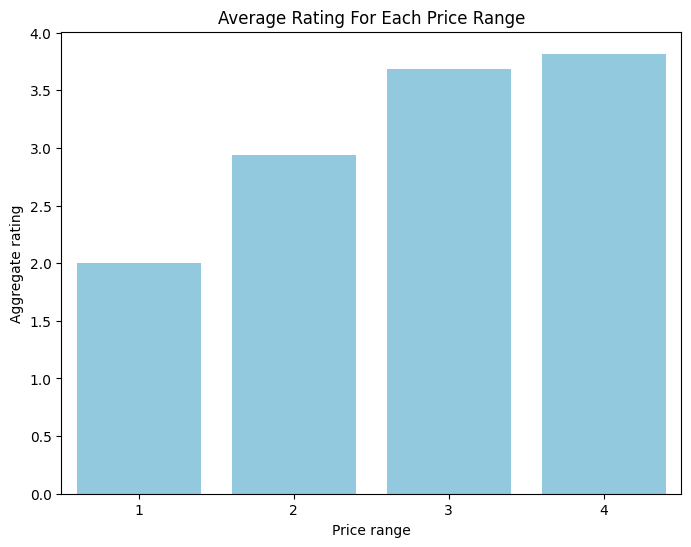

In [34]:
fig = plt.subplots(figsize=(8, 6))
avg_rating_of_price_range = dataset.groupby('Price range')['Aggregate rating'].mean().reset_index()
sns.barplot(x = 'Price range', y = 'Aggregate rating', data = avg_rating_of_price_range, color = 'skyblue')
plt.title('Average Rating For Each Price Range')
plt.show()

### Color that represents the highest average rating among different price ranges

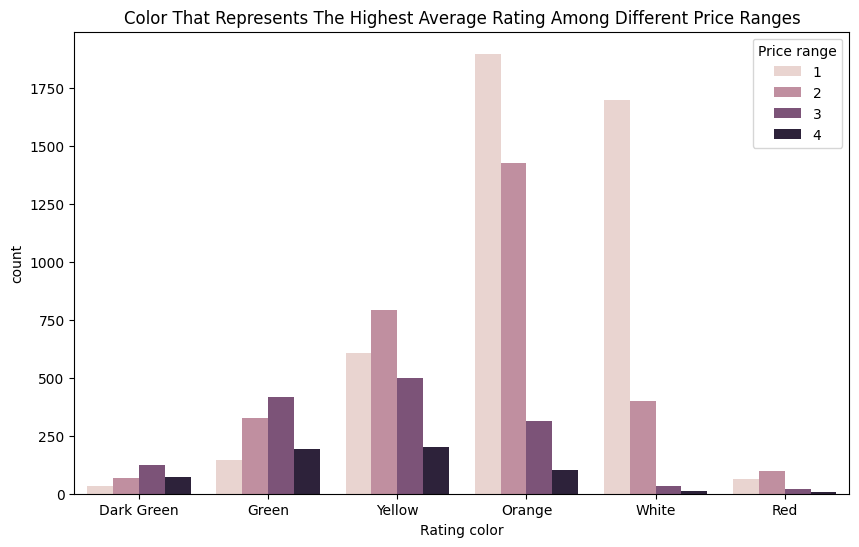

In [35]:
fig = plt.subplots(figsize = (10, 6))
color_rating = dataset['Rating color'].unique()
price_range = dataset['Price range'].unique()
sns.countplot(data = dataset, x = dataset['Rating color'], hue = dataset['Price range'])
plt.title('Color That Represents The Highest Average Rating Among Different Price Ranges')
plt.show()

## Analysis

**Overall Distribution**
The bar plot displays counts of various rating colors segmented by different price ranges (1, 2, 3, 4).

**Price Range 1**
- **Orange:** This color has the highest count in this price range, indicating that "Orange" is the most frequent rating color in the lowest price range.
- **White:** The second most common rating color in this range.
Other colors like Green, Yellow, Dark Green, and Red have significantly lower counts.

**Price Range 2**
- **Orange:** Again, Orange shows a high count, but slightly lower than in Price Range 1.
- **Yellow:** A significant count, indicating it's also quite common in this price range.
- **Green and White:** Moderate counts compared to other colors.

**Price Range 3**
- **Yellow:** Shows the highest count, indicating Yellow is the most common in this price range.
- **Orange:** Still significant but less compared to Price Range 1 and 2.
- **Green and White:** Noticeable counts but less than Yellow and Orange.

**Price Range 4**
- **Green:** Highest count in this price range, suggesting it's the most frequent rating color among the highest price range.
- **Orange:** Noticeable, but much lower compared to Price Ranges 1, 2, and 3.
Other colors have relatively low counts.

#### Interpretation
**Common Colors by Price Range**

- **Price Range 1:** Dominated by "Orange" and "White."
- **Price Range 2:** Dominated by "Orange" and "Yellow."
- **Price Range 3:** Dominated by "Yellow" and "Orange."
- **Price Range 4:** Dominated by "Green."

_________________________________________________________________________________________________________________________________

# Task 3: Feature Engineering
-  Extract additional features from the existing 
columns, such as the length of therestaurant name or address.
-  Create new features like "Has Table Booking" 
or "Has Online Delivery" by encodin 
categorical variable.s.

#### Extract additional features from the existing columns, such as the length of the restaurant name or address.s.

In [36]:
# Length of Restaurant names & address
dataset['Length of Restaurant'] = dataset['Restaurant Name'].apply(len)
dataset['Length of Address'] = dataset['Address'].apply(len)

# Word counts of Restaurant names & address
dataset['Word Counts Restaurants Name'] = dataset['Restaurant Name'].apply(lambda x: len(x.split()))
dataset['Word Counts Address'] = dataset['Address'].apply(lambda x : len(x.split()))

#### New features like "Has Table Booking"or "Has Online Delivery" by encoding categorical variables.

In [37]:
label_encoder_tb = LabelEncoder()
label_encoder_od = LabelEncoder()
dataset['Has Table Booking Label']  = label_encoder_tb.fit_transform(dataset['Has Table booking'])
dataset['Has Online Delivery Label'] = label_encoder_od.fit_transform(dataset['Has Online delivery'])

In [38]:
dataset.head(3)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Rating color,Rating text,Votes,Cluster,Length of Restaurant,Length of Address,Word Counts Restaurants Name,Word Counts Address,Has Table Booking Label,Has Online Delivery Label
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Dark Green,Excellent,314,1,16,71,3,10,1,0
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Dark Green,Excellent,591,1,16,67,2,10,1,0
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Green,Very Good,270,1,22,56,4,8,1,0


_________________________________________________________________________________________________________________________________

# LEVEL 3

## Task 1: Predictive Modeling
- Build a regression model to predict the 
aggregate rating of a restaurant based o 
available feature
- Split the dataset into training and testing sets and evaluate the model's performance using appropriate metrics.
- Experiment with different algorithms (e.g., linear regression, decision trees, random forest) and compare their performance.ormance.

#### Build a regression model to predict the aggregate rating of a restaurant based on available features.

In [39]:
X = dataset.drop(columns=['Aggregate rating', 'Rating color', 'Rating text'])
y = dataset['Aggregate rating']

# Handling categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['number']).columns

# Preprocessing pipelines for both numerical and categorical data
numerical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_cols),
        ('cat', categorical_pipeline, categorical_cols)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100)
}

# Train and evaluate models
results = {}

for model_name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results[model_name] = {'R-squared': r2, 'MAE': mae}

results

{'Linear Regression': {'R-squared': 0.5019966397396483,
  'MAE': 0.8051185667258762},
 'Decision Tree': {'R-squared': 0.9451265472279994,
  'MAE': 0.22689691261119835},
 'Random Forest': {'R-squared': 0.9689130482217194,
  'MAE': 0.17322658294086862}}

#### Split the dataset into training and testing sets and evaluate the model's performance using appropriate metrics.s.

In [40]:
# Selecting the features and target variable
X = dataset.drop(columns=['Aggregate rating', 'Rating color', 'Rating text'])
y = dataset['Aggregate rating']

# Handling categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['number']).columns

# Preprocessing pipelines for both numerical and categorical data
numerical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_cols),
        ('cat', categorical_pipeline, categorical_cols)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100)
}

# Train and evaluate models
results = {}

for model_name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results[model_name] = {'R-squared': r2, 'MAE': mae}

# Display the results
for model_name, metrics in results.items():
    print(f"{model_name}:\n\tR-squared: {metrics['R-squared']}\n\tMAE: {metrics['MAE']}")


Linear Regression:
	R-squared: 0.5019966397396483
	MAE: 0.8051185667258762
Decision Tree:
	R-squared: 0.9451265472279994
	MAE: 0.22689691261119835
Random Forest:
	R-squared: 0.9689130482217194
	MAE: 0.17322658294086862


#### Experiment with different algorithms (e.g., linear regression, decision trees, random forest) and compare their performance

In [41]:
X = dataset.drop(columns=['Aggregate rating', 'Rating color', 'Rating text'])
y = dataset['Aggregate rating']

# Handling categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(include=['number']).columns

# Preprocessing pipelines for both numerical and categorical data
numerical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_cols),
        ('cat', categorical_pipeline, categorical_cols)
    ])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Display the shapes of the resulting datasets
print('X_train : ',X_train.shape)
print('X_test : ',X_test.shape)
print('y_train : ',y_train.shape)
print('y_test : ',y_test.shape)

X_train :  (7640, 25)
X_test :  (1911, 25)
y_train :  (7640,)
y_test :  (1911,)


In [42]:
# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42, n_estimators=100)
}

# Train and evaluate models
results = {}

for model_name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results[model_name] = {'R-squared': r2, 'MAE': mae}

results

{'Linear Regression': {'R-squared': 0.5019966397396483,
  'MAE': 0.8051185667258762},
 'Decision Tree': {'R-squared': 0.9451265472279994,
  'MAE': 0.22689691261119835},
 'Random Forest': {'R-squared': 0.9689130482217194,
  'MAE': 0.17322658294086862}}

In [43]:
X_train_small, _, y_train_small, _ = train_test_split(X_train, y_train, test_size=0.9, random_state=42)

# Train and evaluate models on the smaller dataset
results_small = {}

for model_name, model in models.items():
    pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('model', model)])
    pipeline.fit(X_train_small, y_train_small)
    y_pred = pipeline.predict(X_test)
    
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    results_small[model_name] = {'R-squared': r2, 'MAE': mae}

results_small

{'Linear Regression': {'R-squared': 0.42813764674443366,
  'MAE': 0.8993642882947833},
 'Decision Tree': {'R-squared': 0.9283711540738876,
  'MAE': 0.26562009419152277},
 'Random Forest': {'R-squared': 0.964522451711173, 'MAE': 0.18630612244897962}}

## Task 2: Customer Preference Analysis
- Analyze the relationship between the type of 
cuisine and the restaurant's rating
- Identify the most popular cuisines among 
customers based on the number of votes
- Determine if there are any specific cuisines 
that tend to receive higher ratings..

#### Analyze the relationship between the type of cuisine and the restaurant's rating

C:\Users\hp\AppData\Local\Temp\ipykernel_23032\1527010703.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




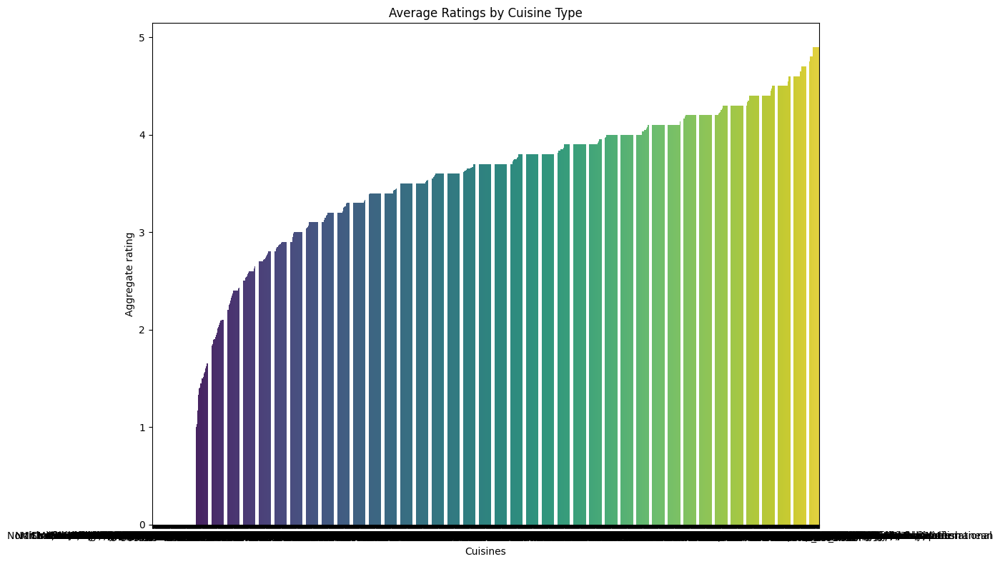

In [44]:
# dataset['Cuisines'].unique()
# dataset['Aggregate rating']

fig = plt.subplots(figsize = (14, 8))
avg_rating = dataset.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending=True)
sns.barplot(x = avg_rating.index, y = avg_rating.values, palette='viridis')
plt.xlabel('Cuisines')
plt.ylabel('Aggregate rating')
plt.title('Average Ratings by Cuisine Type')
# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

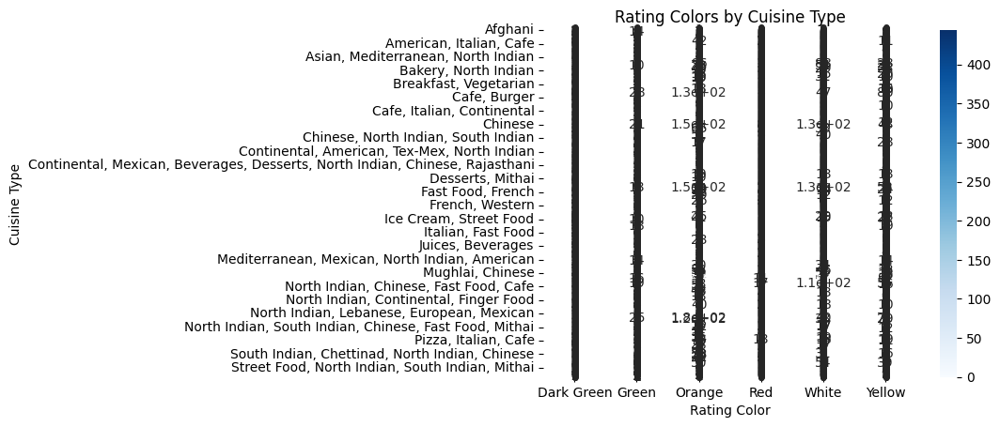

In [45]:
rating_color = dataset.groupby(['Cuisines', 'Rating color']).size().unstack(fill_value=0)
sns.heatmap(rating_color, annot=True, cmap='Blues', cbar=True, linewidths=0.5)
plt.title('Rating Colors by Cuisine Type')
plt.xlabel('Rating Color')
plt.ylabel('Cuisine Type')
plt.show()

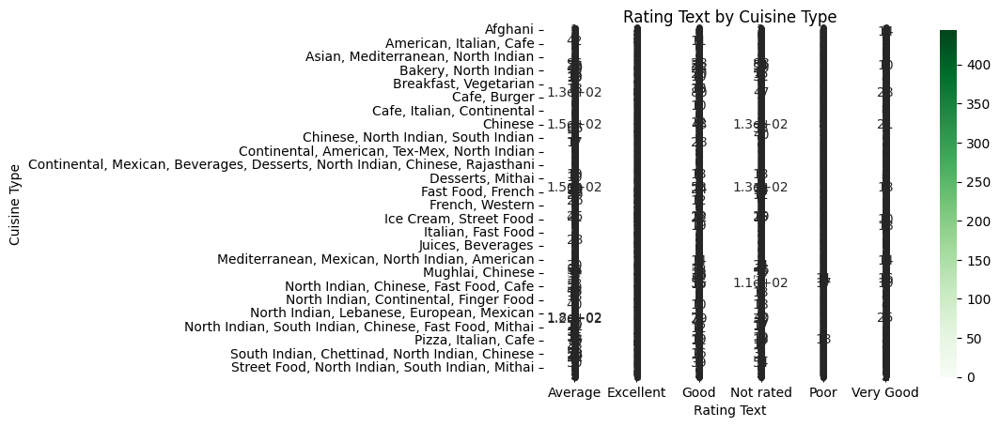

In [46]:
rating_text = dataset.groupby(['Cuisines', 'Rating text']).size().unstack(fill_value = 0)
sns.heatmap(rating_text, annot = True, cmap = 'Greens', cbar = True, linewidths = 0.5)
plt.xlabel('Rating Text')
plt.ylabel('Cuisine Type')
plt.title('Rating Text by Cuisine Type')
plt.show()

#### Identify the most popular cuisines among customers based on the number of votes

In [47]:
top_10_cuisines = dataset['Cuisines'].value_counts()
top_10_votes = dataset['Votes'].value_counts()

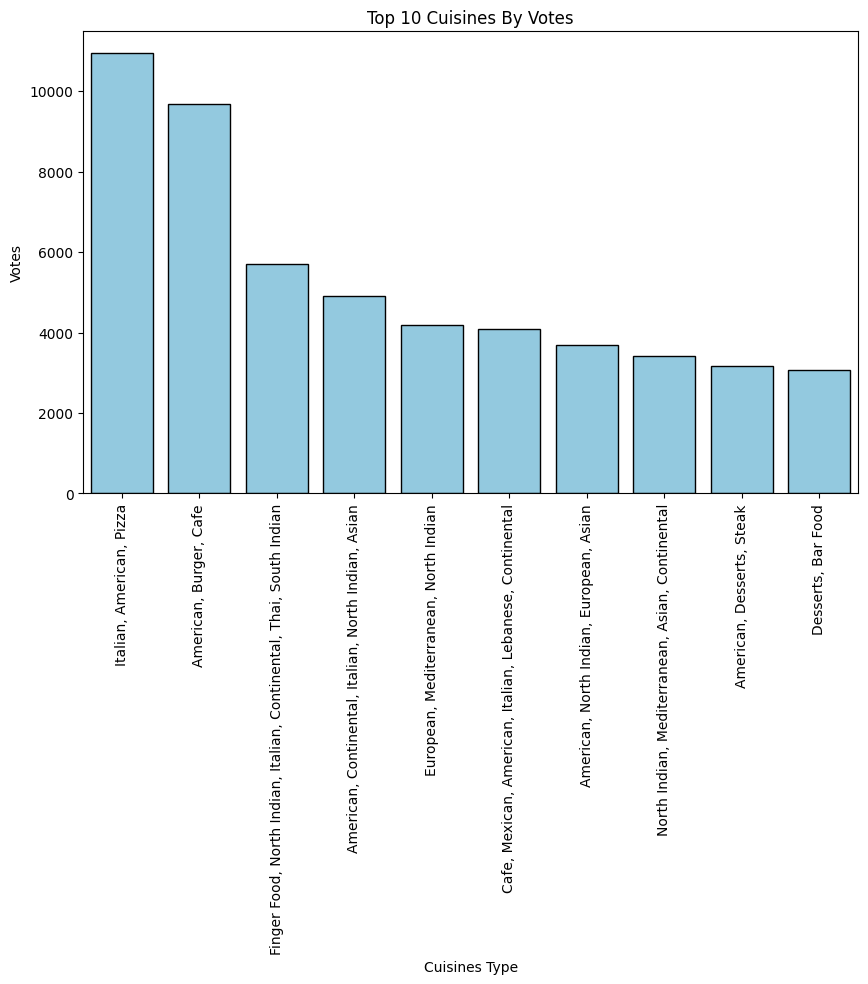

In [48]:
fig = plt.subplots(figsize = (10, 6))
cuisines_and_votes = dataset.groupby('Cuisines')['Votes'].mean().sort_values(ascending = False)
sns.barplot(x = cuisines_and_votes.index[:10], y = cuisines_and_votes.values[:10], color = 'skyblue', edgecolor = 'k')
plt.xlabel('Cuisines Type')
plt.ylabel('Votes')
plt.title('Top 10 Cuisines By Votes')
plt.xticks(rotation = 90)
plt.show()

#### Determine if there are any specific cuisines that tend to receive higher ratings

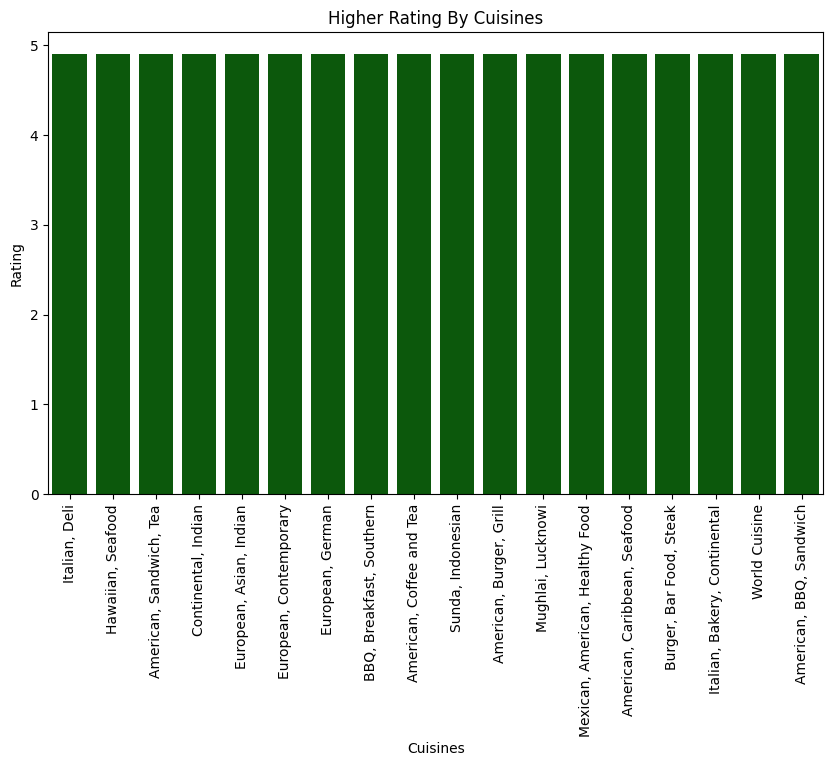

In [49]:
cuisines_by_rating = dataset.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending = False)
fig = plt.subplots(figsize = (10, 6))
sns.barplot(x = cuisines_by_rating.index[:18], y = cuisines_by_rating.values[:18], color = 'darkgreen')
plt.xlabel('Cuisines')
plt.ylabel('Rating')
plt.title('Higher Rating By Cuisines')
plt.xticks(rotation = 90)
plt.show()

**Given the data shown in the bar graph, no particular cuisine tends to receive higher ratings than others, as 18 cuisines are rated the same (4.9). If this rating is based on a limited sample or specific criteria that are not visible from the graph alone, further investigation into the dataset or rating methodology might be needed to draw more nuanced conclusions.**

# Task 3: Data Visualization
- Create visualizations to represent the distribution 
of ratings using different charts (histogram, ba 
plot, etc.
- Compare the average ratings of different cuisines 
or cities using appropriate visualizations
- Visualize the relationship between various 
features and the target variable to gain insights.).

#### Create visualizations to represent the distribution of ratings using different charts (histogram, bar plot, etc.).

In [50]:
rating = dataset['Aggregate rating'].value_counts()

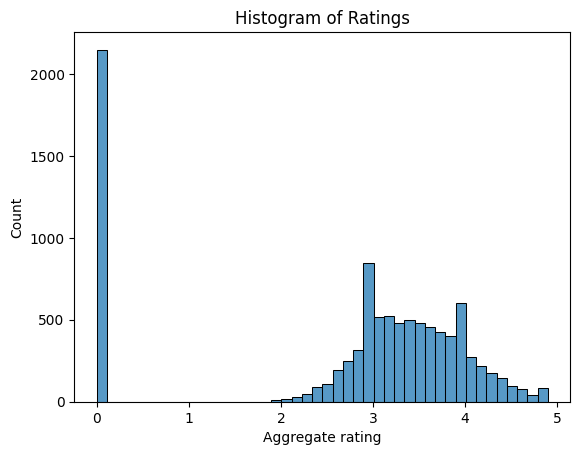

In [51]:
sns.histplot(dataset['Aggregate rating'])
plt.title('Histogram of Ratings')
plt.show()

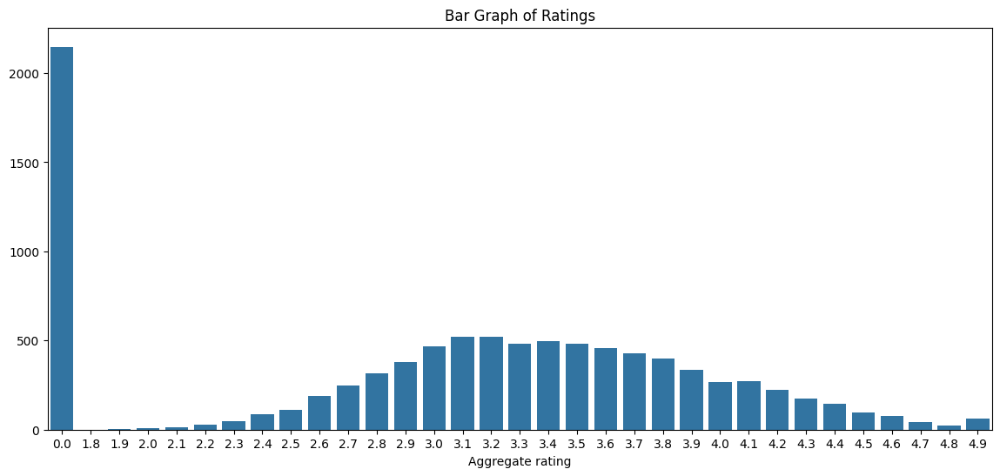

In [52]:
fig = plt.subplots(figsize = (14, 6))
sns.barplot(x = rating.index, y = rating.values)
plt.title('Bar Graph of Ratings')
plt.show()

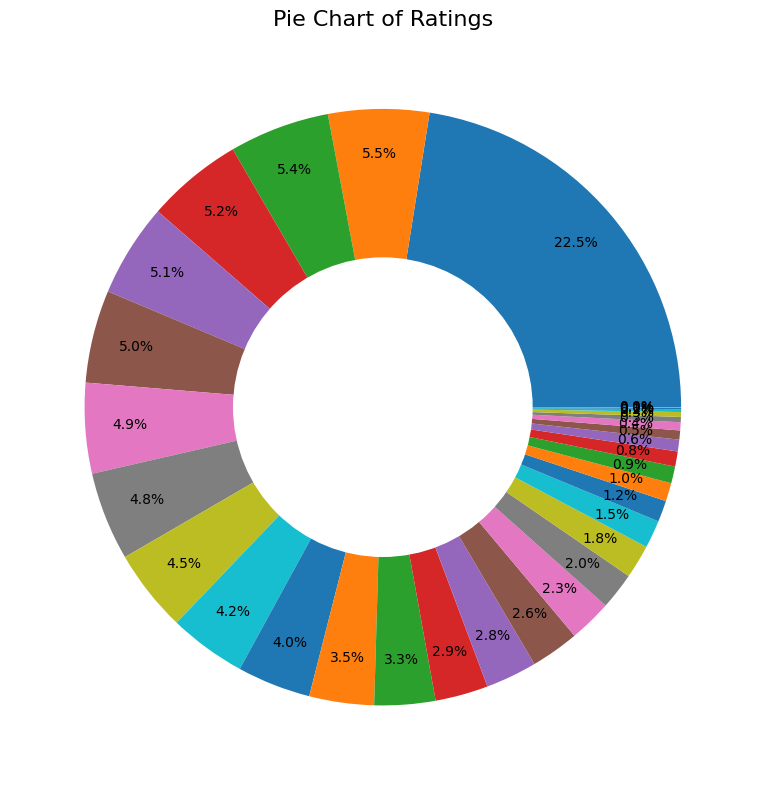

In [53]:
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw=dict(aspect="equal")) 

plt.pie(rating, autopct='%1.1f%%', pctdistance=0.85)
circle = plt.Circle( (0,0), 0.5, color='white')
p = plt.gcf()
p.gca().add_artist(circle)
ax.set_title("Pie Chart of Ratings",fontdict={'fontsize': 16})
plt.tight_layout()
plt.show()

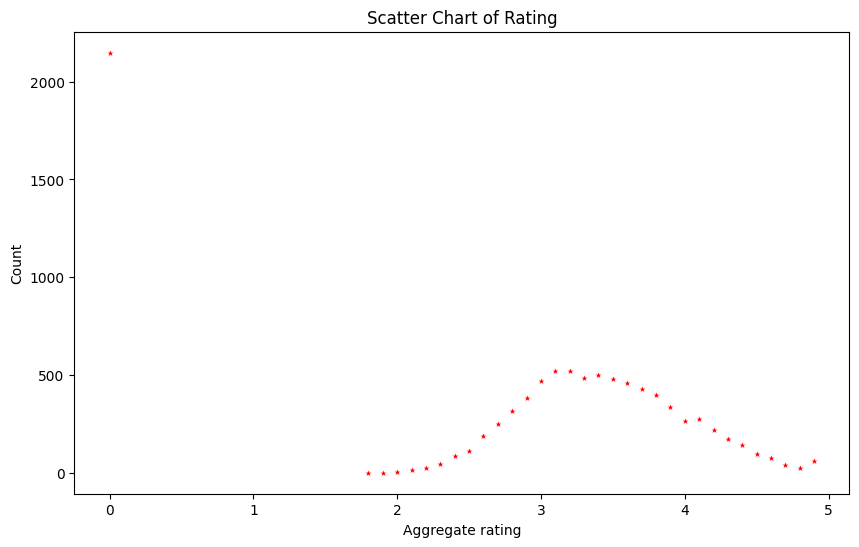

In [54]:
fig = plt.subplots(figsize = (10, 6))
sns.scatterplot(x = rating.index, y = rating.values, color = 'red', marker = '*')
plt.title('Scatter Chart of Rating')
plt.ylabel('Count')
plt.show()

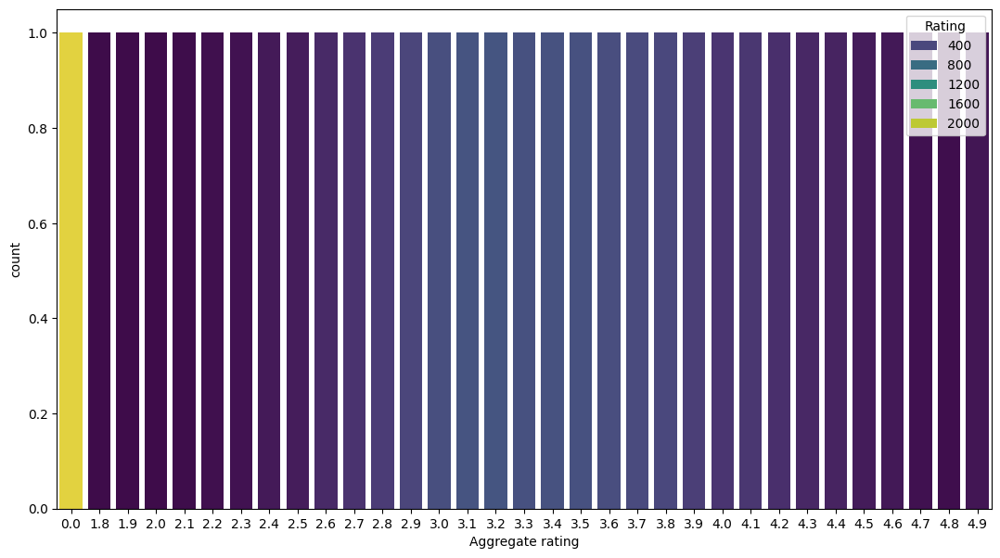

In [55]:
fig = plt.subplots(figsize = (13, 7))
sns.countplot(x = rating.index, hue = rating.values, palette = 'viridis')
plt.legend(title = 'Rating', loc = 'upper right')
plt.show()

#### Compare the average ratings of different cuisines or cities using appropriate visualizations.

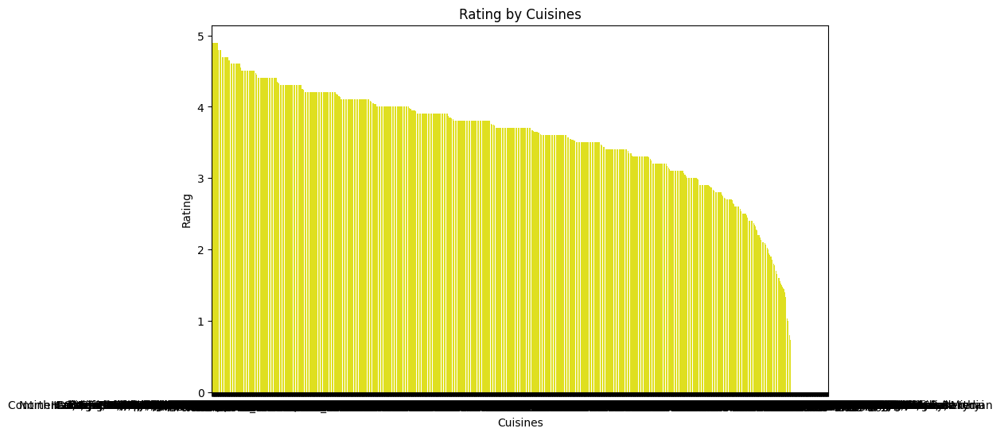

In [56]:
cuisines_by_rating = dataset.groupby('Cuisines')['Aggregate rating'].mean().sort_values(ascending = False)
fig = plt.subplots(figsize = (10, 6))
sns.barplot(x = cuisines_by_rating.index, y = cuisines_by_rating.values, color = 'yellow')
plt.xlabel('Cuisines')
plt.ylabel('Rating')
plt.title('Rating by Cuisines')
plt.show()

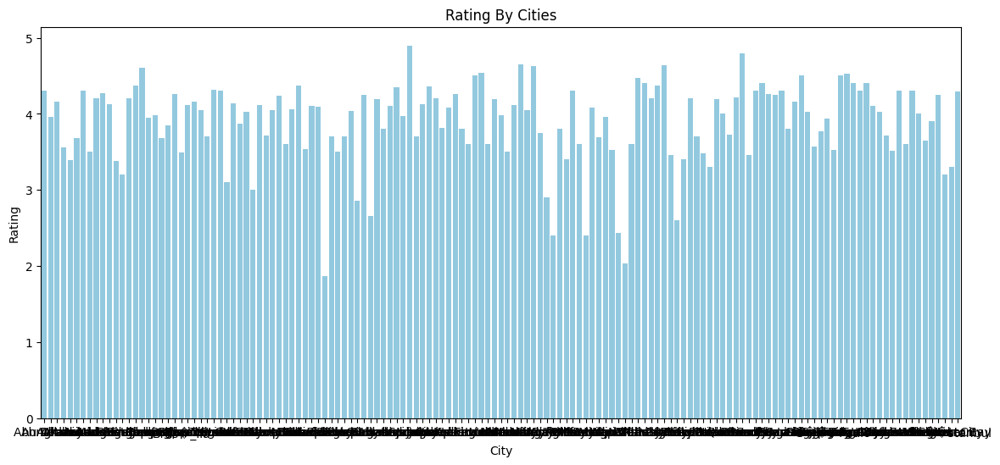

In [57]:
cuisines_by_rating = dataset.groupby('City')['Aggregate rating'].mean()
fig = plt.subplots(figsize = (14, 6))
sns.barplot(x = cuisines_by_rating.index, y = cuisines_by_rating.values, color = 'skyblue')
plt.xlabel('City')
plt.ylabel('Rating')
plt.title('Rating By Cities')
plt.show()

#### Visualize the relationship between various features and the target variable to gain insights.

In [58]:
dataset['Country Code']
dataset['Aggregate rating']
dataset['City']
dataset['Price range']
dataset['Cuisines']
dataset['Votes']

0        314
1        591
2        270
3        365
4        229
        ... 
9546     788
9547    1034
9548     661
9549     901
9550     591
Name: Votes, Length: 9551, dtype: int64

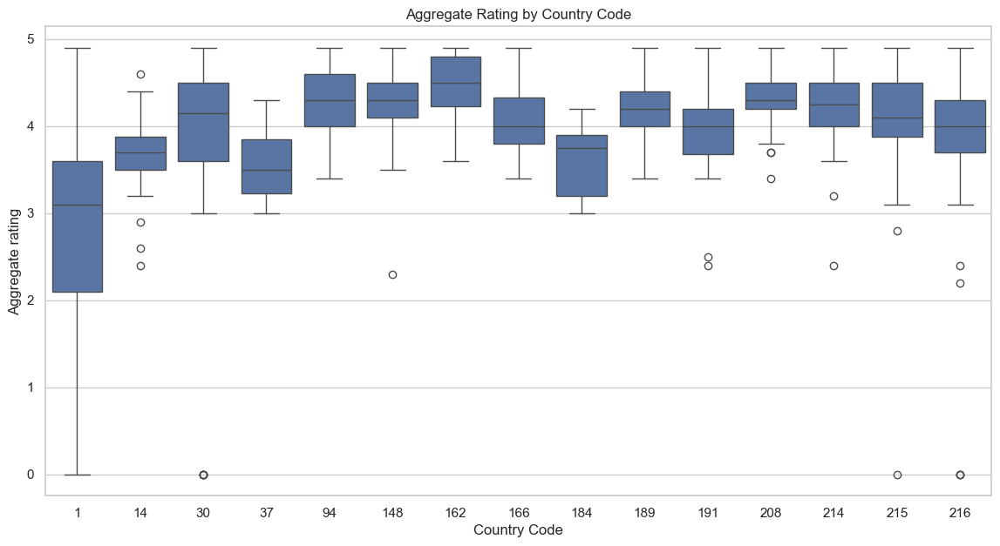

In [59]:
sns.set(style="whitegrid")

# Aggregate rating by Country Code
plt.figure(figsize = (14, 7))
sns.boxplot(x = 'Country Code', y = 'Aggregate rating', data = dataset)
plt.title('Aggregate Rating by Country Code')
plt.xticks(rotation = 0)
plt.show()

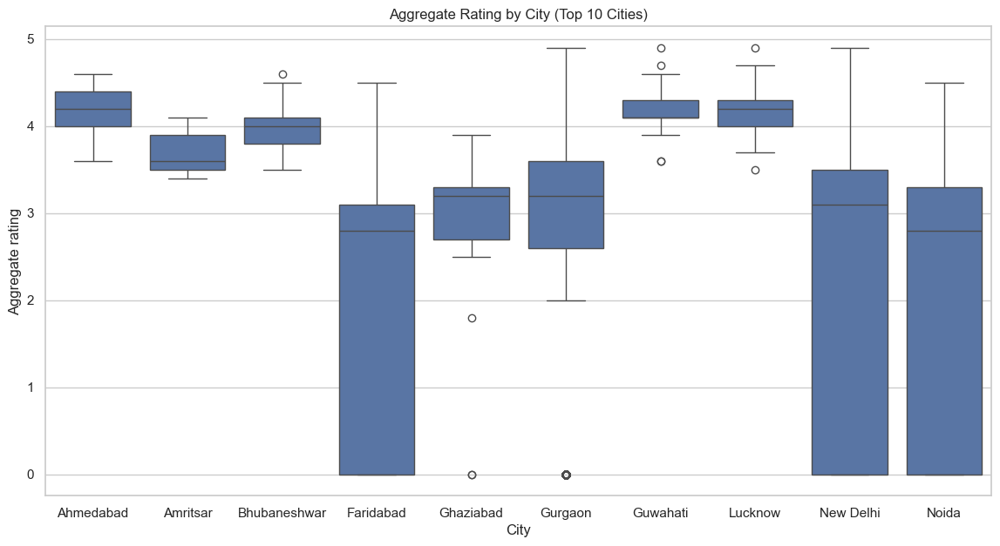

In [60]:
# Aggregate rating by City (top 10 cities by number of restaurants)

top_cities = dataset['City'].value_counts().nlargest(10).index
top_cities_data = dataset[dataset['City'].isin(top_cities)]
plt.figure(figsize = (14, 7))
sns.boxplot(x = 'City', y = 'Aggregate rating', data = top_cities_data)
plt.title('Aggregate Rating by City (Top 10 Cities)')
plt.xticks(rotation = 0)
plt.show()

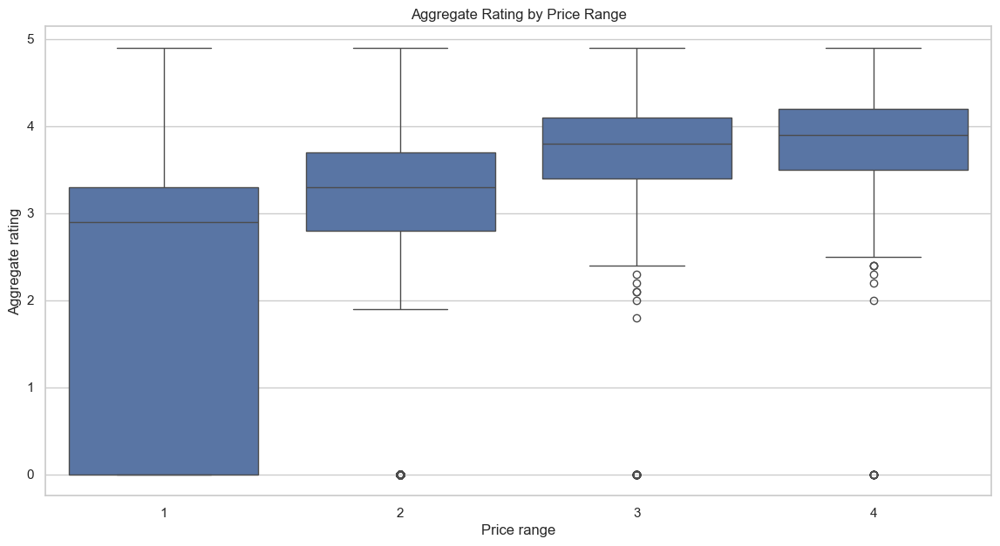

In [61]:
# Aggregate rating by Price range
plt.figure(figsize = (14, 7))
sns.boxplot(x = 'Price range', y = 'Aggregate rating', data = dataset)
plt.title('Aggregate Rating by Price Range')
plt.xticks(rotation = 0)
plt.show()


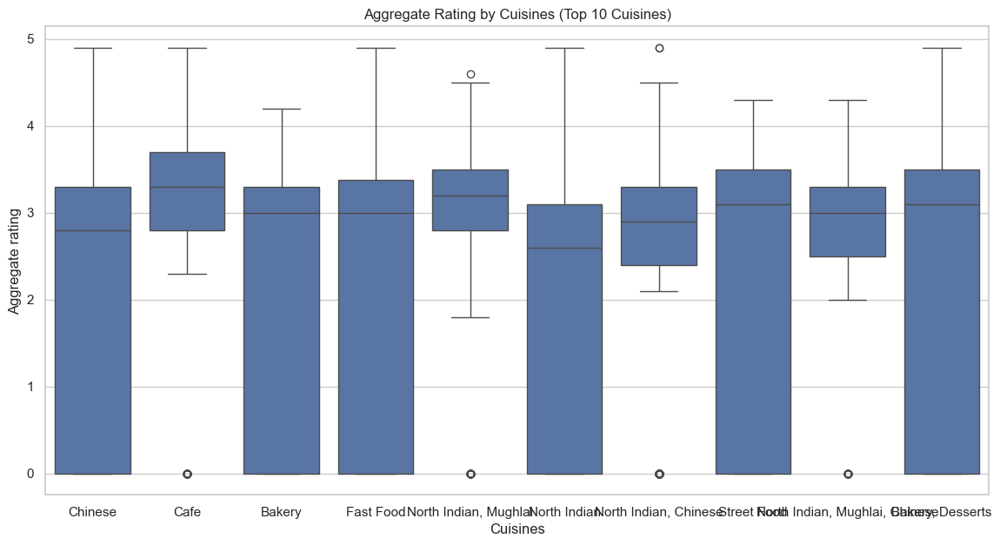

In [62]:
# Aggregate rating by Cuisines (top 10 cuisines)
top_cuisines = dataset['Cuisines'].value_counts().nlargest(10).index
top_cuisines_data = dataset[dataset['Cuisines'].isin(top_cuisines)]
plt.figure(figsize = (14, 7))
sns.boxplot(x = 'Cuisines', y = 'Aggregate rating', data = top_cuisines_data)
plt.title('Aggregate Rating by Cuisines (Top 10 Cuisines)')
plt.xticks(rotation = 0)
plt.show()

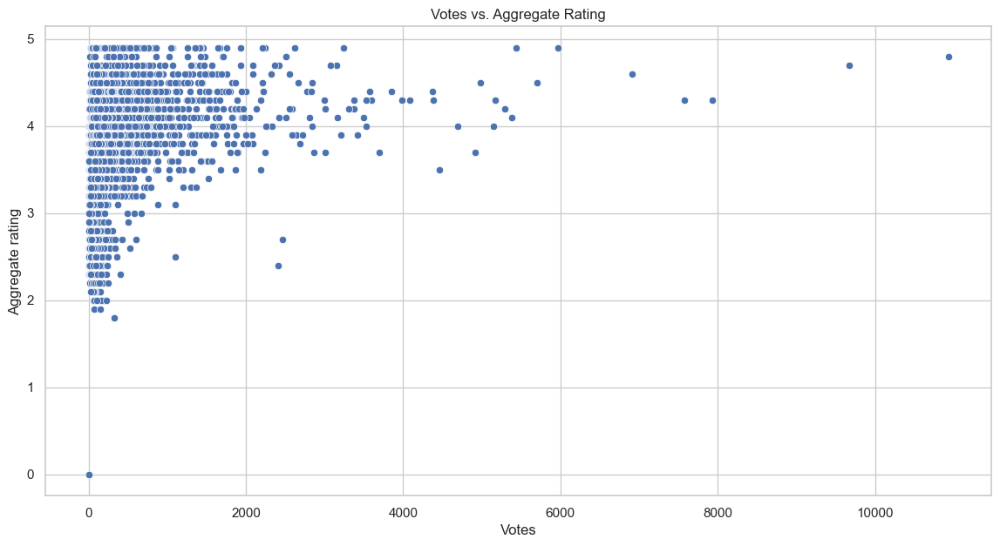

In [63]:
# Plot 5: Relationship between Votes and Aggregate rating
plt.figure(figsize = (14, 7))
sns.scatterplot(x = 'Votes', y = 'Aggregate rating', data = dataset)
plt.title('Votes vs. Aggregate Rating')
plt.show()